# Thread Implementation Considerations
1. Based on Sun/Solaries papers
1. Linux threading model


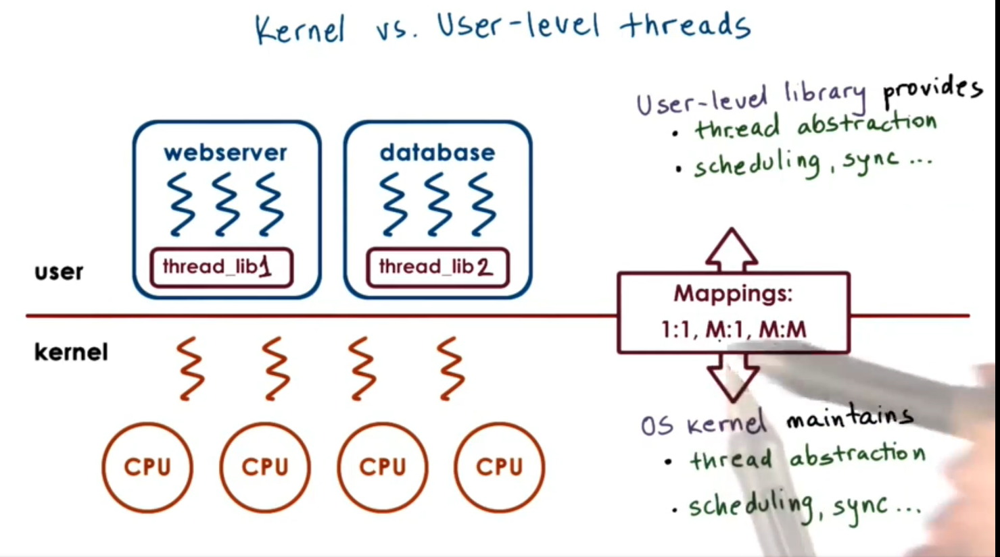
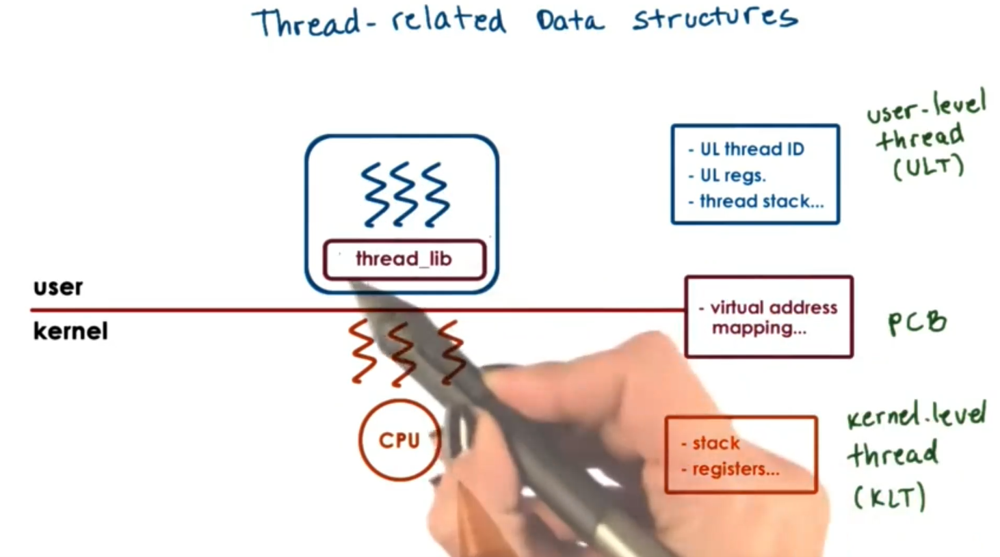

If we want multi kenal level thread

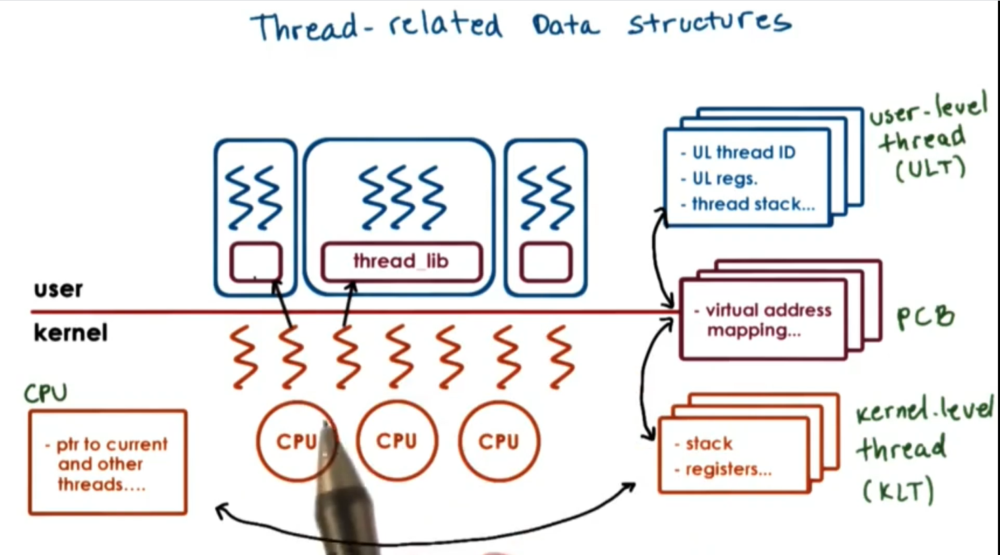


started with a large PCB structure, and divide the information across a number of different data structure. 

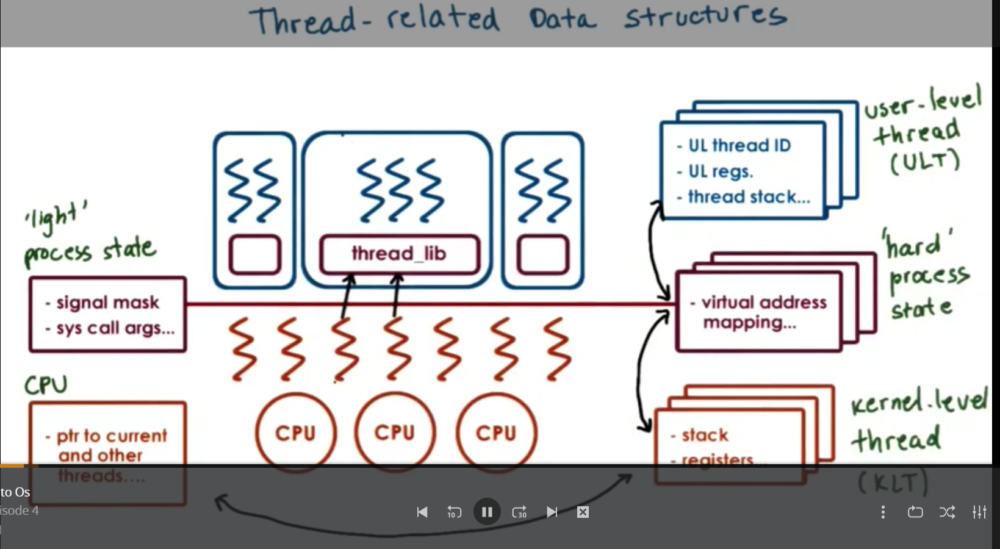

### Single PCB:
1. large continous data structure
1. private for each entity
1. saved and restored on each context switch
1. update for any changes 

Cons: 
1. Scalability
1. Overheads
1. Performance
1. Flexibility


### Multiple Data Structures: 
1. Smaller data structures: maintain pointers to point to much smaller data elements
1. Easier to share
1. On context switch only save and restore what needed to change
1. User-level library need only update portion of the state

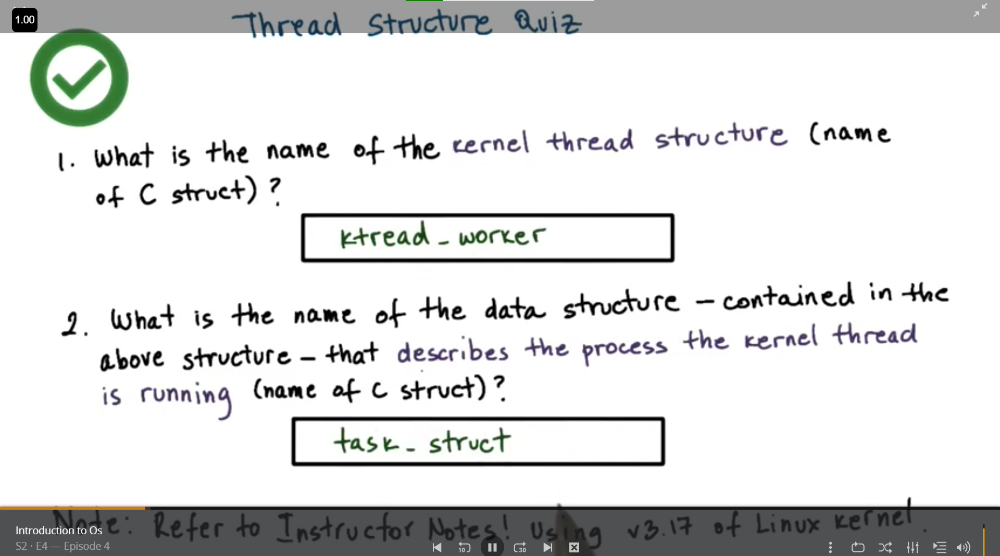

Sun OS 5.0 Trheading model
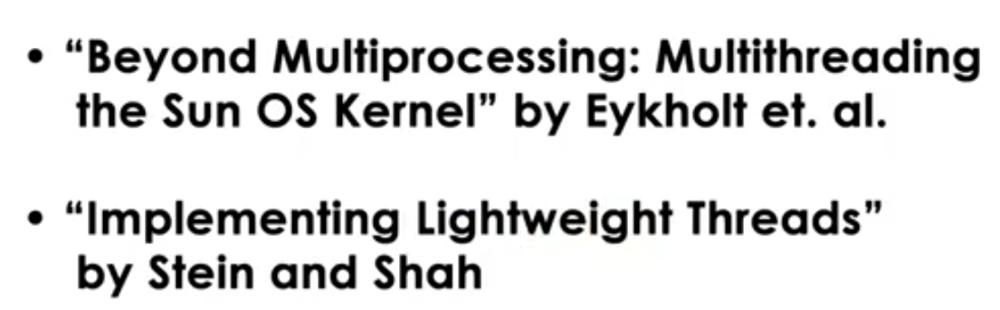
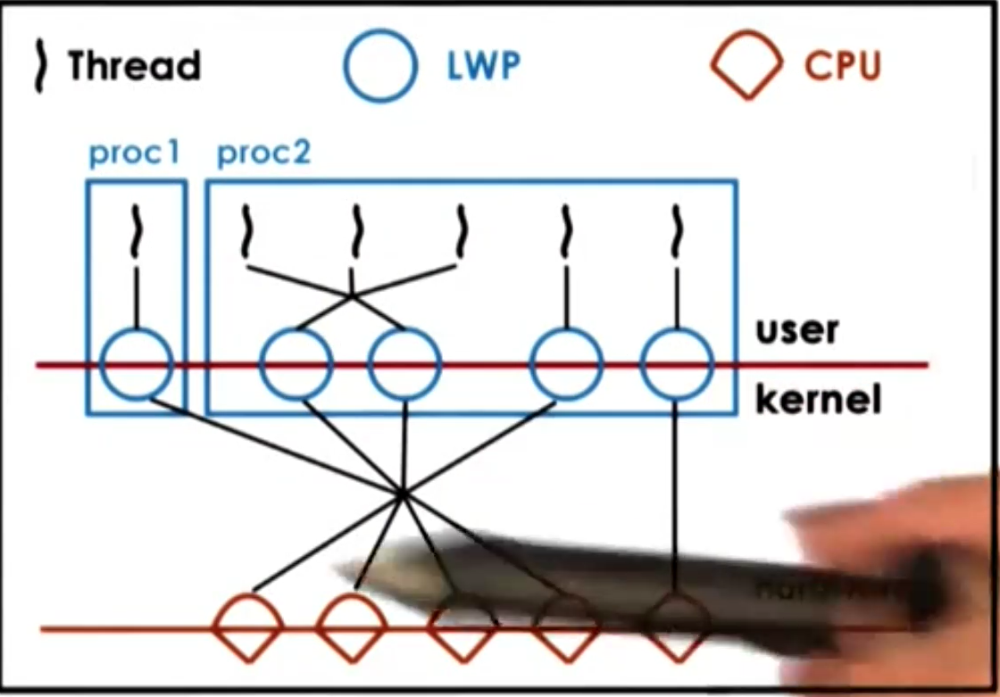

### Kernal-level data structures

Process:
1. list of kernal-level thread
1. virtal address space
1. user credientials
1. signal handlers

Light weight process (LWP) data structures, containing information that are relavent for the subset of the process
1. user level registers
1. system call args
1. resource usage info
1. signal mask
1. Similar to ULT but visible to kernal not needed when process not running.
1. If we want to find the aggragate resource usages for the entire process, we need to walk through all the LWP processes.    


Kernal-level threads:
1. kernal level registers
1. Stack pointer
1. Scheduling info (class, ...)
1. pointers to other data structures associated with the kernal such as associated LWP, process, CPU structures
1. Include kernel level thread execution context. The information is always needed even when process not running -> not swappable

CPU:
1. current thread
1. list of kernel-level thread
1. dispatching and interrupt handling information 
On PSARC dedicated reg == corrent thread

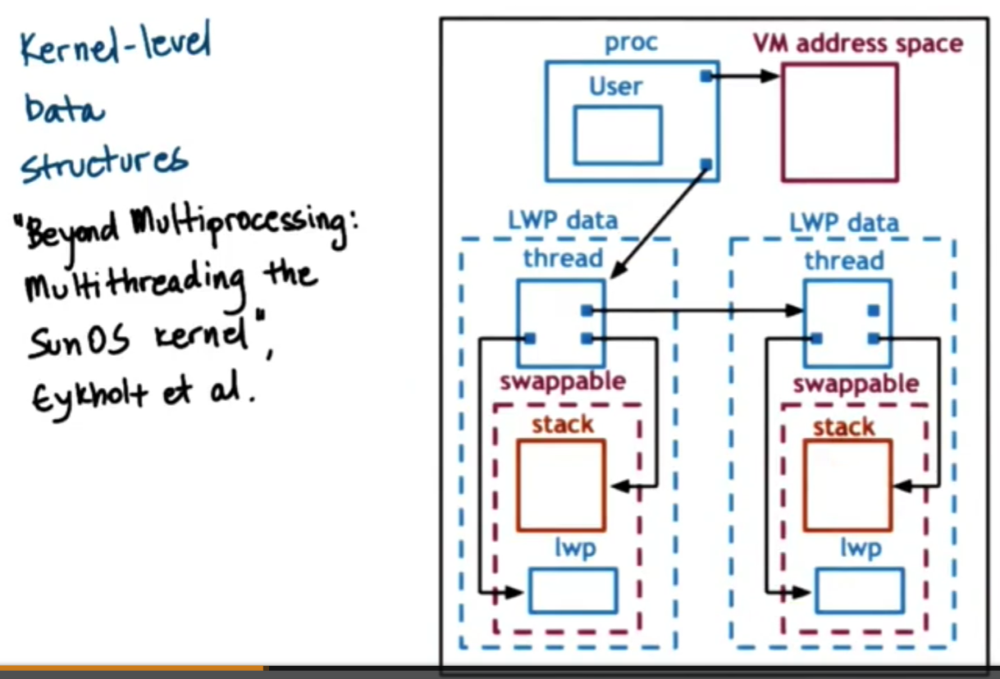

### Basicd thread management Interactions

Assume process requests 2 kernel level threads. What happens whe nprocess starts? 
1. Kernel gives default # KLTs (1)
1. The process will request additional KLT (kernel supports system call, set_concurrency which will create additional KLTs and allocate to the process)
1. If all KTLs are blocked, and user level library has ULTs ready to run.
1. User-level library doesn't know what is happending in the kernel. 
1. the kernal notifiies user-level library before blocking the KLTs. The ULTs can look at the run queue and see if there is any runnable ULTs and get more LWPs/KLTs. 
1. When IO completes, kernel will notice that the extra thread becomes idel, the kernel will tell user-level library that you don't have access to the thread and can't schedule it.
1. Kernel doesn't know that's happening in the user-level library. 
1. System calls and specail signals allow kernel and ULT library to interact and coordinate 

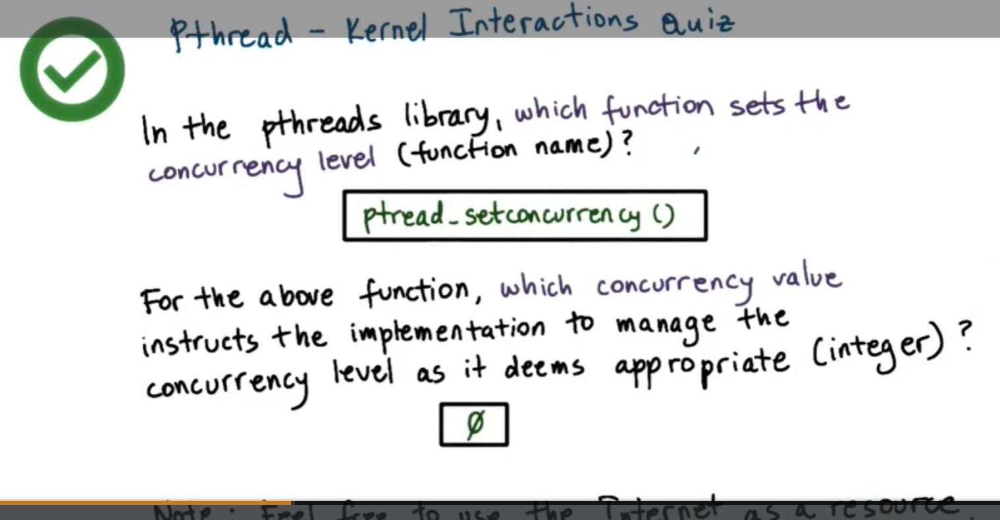
0:underlying manager should decide how to manage concurrency level for the particular process.



### Lack of Thtread Management Visibility

UL library sees
1. ULTs of the process
1. available KLTs assigned to the process, but it's the kernel actually manages the KLTs

Kernel sees:
1. KLTs
1. CPUs
1. KL scheduler


User level library can request one of its user level threads be bond to to KLT

Thread pinning: If a KTL is permanently associated with a CPU 
Bound thread: 1:1 ULT and KTL bound

Problem: visibilty of state and decisions between kernel and UL libray, if KLTs are locked no ULTs can run even they are ready. 

Invisible to kernel: mutex vaiable wait queues

Many to many:
1. UL scheduling decisions that kernel doesn't aware
1. change ULT-KLT mapping

1-1 helps address some of these issues.



### How/when does the UL library run

Process jumps to UL library scheduler when
1. ULTs explicitly yield
1. timer set by UL library expires
1. ULTs call library functions like lock/unlock
1. locked threads become runnable
1. runs on ULT operatoins
1. runs on signals from time or kernel




### issues on multiple CPUs
One CPU can't modify another cpu's register, so we have to send signal from the context of one KLT on one CPU to another KLT on the other CPU to run library code locally. 

### Synchronization- related issues

ULTs different CPUs wants mutex: put on a mutex queue then context switch

####Adaptive mutexes:
1. if the critical section short, don't block the thread. Instead just loop and spin and wait till the mutex is released. It takes less time than context swtich.
1. FOr long critical sections default blocking behavior is desired. 
1. In a single CPU no context switch is needed so no need to spin.
1. Thread information can be useful. 
    1. If we try to lock a mutex and the mutex is currently busy. We can look quickly who the owner of the mutex is and veryfy if the other thread is running on the other CPU. That will tell us if we should spin or block. 
    1. Also the type of mutex so we know if the owner will release it quickly or not.






### Destroying threads
1. instead of destroying, resue threads
1. When a thread exits
    1. put on a death row
    1. periodically destroyed by reaper thread
    1. otherwise thread structures/stacks are reused: performance gains

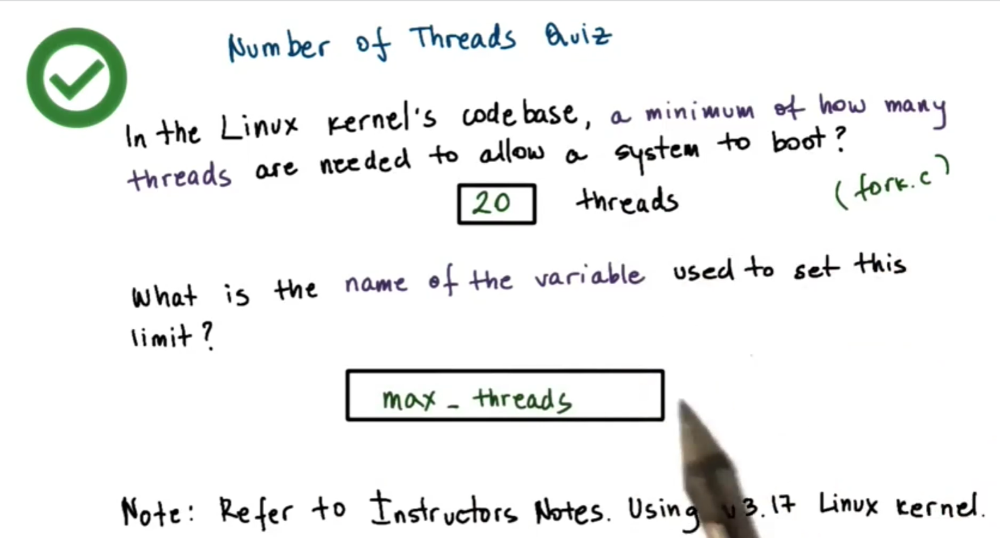

### Interrupts vs signals

Interrups:
1. events generated externallly by components other than the CPU (I/O devices, timers, other CPUs)
1. determined based on the pysical platform
1. appear asynchronously: not response to some actions taken by the CPU


Signals:
1. events triggered by the CPU & software running on it
1. determined based on the oeprating system, two identical platforms can have same interrupt but if they run different OS they will have different signals 
1. appear both sychronosly or asynchronously


Simillar
1. have a unique ID depending on the hardware or OS
1. can be masked and disabled depended via corresponding mask
    1. per-CPU interrupt mask
    1. per-process signal mask
1. if enabled, trigger corresponding handler 
    1. interrupt handler set for entire system by OS
    1. signal handlers set on per process basis by process


They can be 
1. handled in specific ways: interrupt and signal handlers
1. can be ignored: interrupt/signal mask
1. expected or unexpected: appear sync or async



### Interrupts

An external device send notification (MSI#) to a CPU via interconnect (PCI) between the device and CPU complex. 
1. Moden signal interrupter (MSI#): uniquely identify the interupt (which device generated the interrupt)   
1. Based on interrupt number (INT#), interrupt handler table has the handler start address of the routine to handle each INT#.
1. How the interrupt is handled is OS specific. 


### Signal
1. OS determines the signal
1. OS send signal back to process
1. OS maintains a signal handler table of each signal in the system, which specifies the starting address of the handling routine. 
1. The handlers is process specific. 


#### Handlers/Actions
1. OS has default actions to handling signals: terminate, ignore, terminate and core dump, stop or continue. 
1. Process installs handlers: 
    1. signals(), sigaction() for most signals
    1. some cannot be causght, ususlly always kill the process
    
Synchronoous
1. SIGSEGV (access to protested memory)
1. SIGFPE (divide by zero)
1. SIGKILL (kill, id) 
1. Can be directed to a specific thread. 

Asynchronous
1. SIGKILL (kill): 
1. SIGALARM

### Why disable interrupts or signals?
When interrupt
1. PC point to the first instruction in handler
1. SP keep a stack of thread. 
1. If the thread has locked a mutex used in a handler, there will be a deadlock siutation 


To sovle the problem:
1. keep handler code simple, but it's too restrictive
1. Control interruptions by handler code: 
    1. use interrupt/signal masks: a sequence of bits corresponding to interupts/signal
    1. if a handler is disabled, then the interrupt/signal will be handled when the mask value changes. 
    1. When disabled, multiple instance may occur but when enabled the handling routine will be executed only once. 
    

In [ ]:
clear_field_in_mask(mask);
lock(mutex);
//disabled => remain pending
unlock(mutex);
reset_field_in_mask(mask);
//enabled => execute handler code.

1. Intrerupt masks are per CPU. If mask disableds interrupt => hardware interrupt routing mechanism will not deliver interrupt to cpu. 

1. Signal masks are per execution context (ULT on top of KLT). If mask disables signal=>kernel sees mask and will not interrupt corresponding thread. 

### Interrupts on multicore systems
1. Interrupts can be directed to any cpu that has them enabled
1. may set interrupt on just one single core to avoid overhead & perturbations on allother cores


### Types of Signals

One-shot signals:
1. n signals pending == 1 signal pending: at least once
1. must be explicitly re-enabled.  xxxxxxxxxxxxxx ### 56:34

Real time signals
1. if n signals raised the nhandler is called n times. 
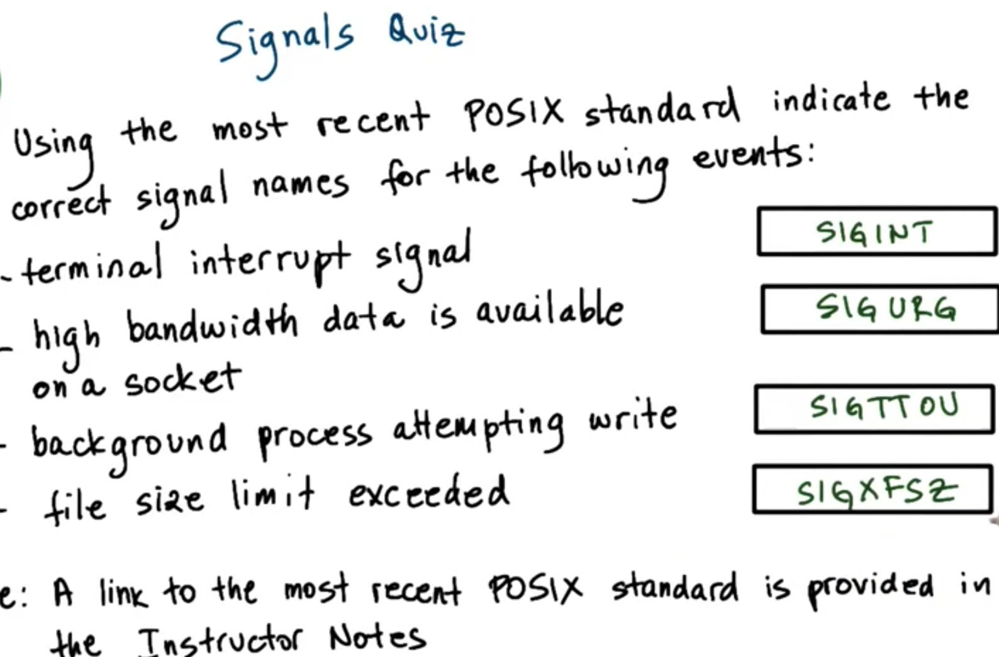.

### Handling Interrupts as Threads

1. When a interrupt/signal occurs, handler is executed on a seperate thread. If the handler thread is blocked by mutex, then the original thread will be scheduled. When the unlock situation happens we go back to the handler thread and complete the routine. 
1. but dynamic thread creation is expensive
1. Dynamic decision:
    1. if handler doesn't lock => execute on interrupted thread's stack
    1. if handler can block => turn into read thread
1. optimization:
    1. kernel precreate & preinitialize thread structreus for interrupt routines. 


### Top vs Bottom Half
1. Top half: fast, non-blocking, min amount of processing
1. bottom half: arbitrary complexity
1. If you want arbitrary functionality to be incorporated in the interrupt handling operations, the handling routine must be executed by another thread. 
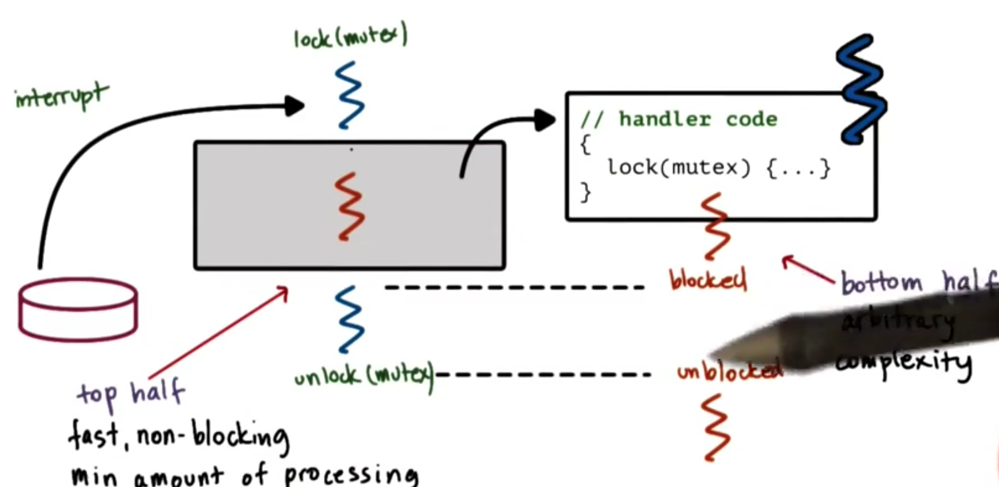

### Performance Bottomline

Overall Cost
1. overhead of 40 SPARC instructions per interrupt
1. Saving of 12 instructions per mutex if there is no changes in interrupt mask, level ...
1. if fewer interrupts than mutex lock/unlock operation, handling interrupt in a seperate thread is a win. 
1. Optimize ofr the common case. 


### Threads and Signal Handling
If ULT disable signal mask but KLT enable the signal. Signal occurs, what to do with the signal?

1. ULT mask = 1, KLT mask = 1: KLT interrupt ULT
1. ULT mask = 0 another ULT mask = 1, KLT mask = 1: we can have a libray handling routine wrap the signal handling routine, UL library can see which thread can handle the signal. UL library can schedule the thread on the KLT. 
1. ULT mask = 0 another ULT mask = 1, 2 KLTs mask = 1: UL library will direct the signal to the KLT where the signal enabled ULT is executing. 
1. All ULT masks = 0, KLTs masks = 1; when UL library finds that no ULT can hanlde the signal, if will change the signal mask of the KLT who send the signal to 0. Then reissue the signal for the entire process again with another KLT with mask of 1. So all KLTs will have mask of 1. So the kernel knows the signal is disabled by the process. 
1. When UL library unmask the signal to 1, it will make a system call and update the KTL mask values. 
1. Optimize Commmon Case
    1. Signals less freqent than signal mask updates
    1. Some system calls avoided - cheaper to update UL mask
    1. signal handling more expensive.

### Task Struct in Linux

1. main execution tasbstraction => task: execution context of a kernel level thread
1. Single-threaded process: 1 task
1. Multi-threaded process: many tasks.

    

In [ ]:
//Task struct in Linux
struct task_struct {
    pid_t pid; //task id
    pid_t tgid; //group id, the first created task id in the group
    int prio;
    volatile long state;
    struct mm_struct *mm;
    struct files_struct *files;
    struct list_head tasks; // the list of tasks which are part of a single process
    int on_cpu;
    cpumask_t cpu_allowed;
    //...
}
// process state was always represented by a collection of reference or pointers to data structures. So it's easier for tasks in a single process to share.

### Task creation clone:
clone(function, stack_ptr, sharing_flags, args)


sharing_flags: which portion of the state of a task will be shared between the parent and child task.
1. If all set, share everything in the same virtual address space
1. If all cleard, not share, create a new process (like forking a process). 

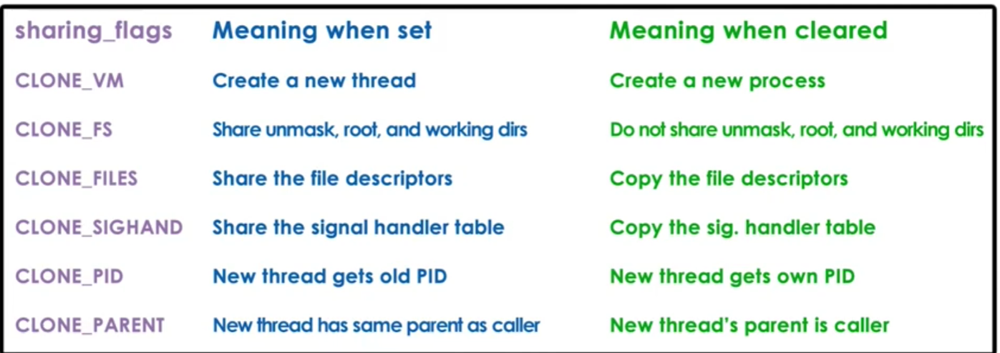

Forking: 
1. implemented with clone with flags cleared
1. For a single thread process when folking we expect its a full replicated process. 
1. With multithread process, the child will be single thread process with portion of address space visible to the parent thread/task in the process called the folk. 

### Linux Threads Model
Current: Native POSIX Threads Library (NPTL) "1:1 model": one kernel level task for each ULT.
1. kernel sees each ULT info
1. kernel traps are cheaper: cross kernel/user 
1. more resources: memory, large range of IDs


Older Linux Threads "M-M model" - similar issues to those described in Solaris papers. 
May fit for some more complicated situation. 

### Summary
Sun/Solaris papers
1. implementation insights for supporting user/kernel-level threads
1. Historic perspective on Linux threading models

Interrupts and signals